# NWTC site characterization through M4 and M5

## setup

In [1]:
import os, glob
import numpy as np
import pandas as pd
from calendar import monthrange,month_name
import matplotlib.pyplot as plt
import scipy.stats as stats
from matplotlib.colors import BoundaryNorm
import funcs as funcs

In [2]:
%matplotlib inline
fs = 12
plt.rc('font', family='serif')
plt.rc('font', size=fs)

In [3]:
# date parser for pandas
dp = lambda x: pd.datetime.strptime(x,'%d-%m-%Y %H:%M:%S')

In [5]:
# paths (must mount volume smb://nrel.gov/shared/wind/WindWeb/MetData/135mData/M5Twr)

metPathLoHz = '/Volumes/M5Twr/10min/txt/'
figPath = '../../figs/'
# metPathLoHz = '/Volumes/shared/Wind/WindWeb/MetData/135mData/M5Twr/10min/txt/'

In [6]:
# time range
years  = [ int(a) for a in np.arange(2012,2018,1) ] #[2017]
months = [ int(a) for a in np.arange(1,12.1,1) ]

In [7]:
red = '#E74C3C'
blue = '#2E86C1'
dark_gray = '#2C3E50'
light_gray = '#808B96'

# READ IN DATA

In [14]:
filecount = 0
for year in years:
    print(year)
    for month in months:
        fName = glob.glob(os.path.join(metPathLoHz,'{0}_{1}.txt'.format(year,month_name[month])))        
        if len(fName)>0:
            fName = fName[0] ; print(fName)
            df_lo = pd.read_csv(fName,index_col=[0],parse_dates=[0],date_parser=dp,skiprows=[0,1,2,3,4,5,6,8,9],
                               low_memory=False)
            if filecount==0:
                df = df_lo.copy()
            else:
                df = df.append(df_lo.copy())
            filecount += 1
df.index = df.index.tz_localize('UTC').tz_convert('America/Denver')            

2012
/Volumes/M5Twr/10min/txt/2012_August.txt
/Volumes/M5Twr/10min/txt/2012_September.txt
/Volumes/M5Twr/10min/txt/2012_October.txt
/Volumes/M5Twr/10min/txt/2012_November.txt
/Volumes/M5Twr/10min/txt/2012_December.txt
2013
/Volumes/M5Twr/10min/txt/2013_January.txt
/Volumes/M5Twr/10min/txt/2013_February.txt
/Volumes/M5Twr/10min/txt/2013_March.txt
/Volumes/M5Twr/10min/txt/2013_April.txt
/Volumes/M5Twr/10min/txt/2013_May.txt
/Volumes/M5Twr/10min/txt/2013_June.txt
/Volumes/M5Twr/10min/txt/2013_July.txt
/Volumes/M5Twr/10min/txt/2013_August.txt
/Volumes/M5Twr/10min/txt/2013_September.txt
/Volumes/M5Twr/10min/txt/2013_October.txt
/Volumes/M5Twr/10min/txt/2013_November.txt
/Volumes/M5Twr/10min/txt/2013_December.txt
2014
/Volumes/M5Twr/10min/txt/2014_January.txt
/Volumes/M5Twr/10min/txt/2014_February.txt
/Volumes/M5Twr/10min/txt/2014_March.txt
/Volumes/M5Twr/10min/txt/2014_April.txt
/Volumes/M5Twr/10min/txt/2014_May.txt
/Volumes/M5Twr/10min/txt/2014_June.txt
/Volumes/M5Twr/10min/txt/2014_July.t

In [15]:
df[df==-999.0] = np.nan

# QC FILTERS
drop all nan values (those that have been flagged by the qc process already in place.)

In [16]:
df_qc = df.copy()

In [18]:
# remove bad data (qc flag!=1)
for qcPrefix in df_qc.columns:
    if 'qc' in qcPrefix.lower():
        dataPrefix = ' '.join(qcPrefix.split()[0:-1])
        idx = df_qc[qcPrefix]!=1
        df_qc.loc[idx.values,dataPrefix] = np.nan
#         print("{0} records set to NaN for {1}".format(idx.sum(),dataPrefix))

In [19]:
df_qc = df_qc.dropna(how='all')

# DATA COMPLETENESS

In [20]:
# evaluate how complete the data are
maxObs   = np.zeros((len(months),len(years)))
availObs = np.zeros((len(months),len(years)))

for iyear,year in enumerate(years):
    for imonth,month in enumerate(months):

        junk, ndays = monthrange(year,month)
        maxObs[imonth,iyear] = ndays*24*6

        t1 = str(pd.to_datetime('{0}{1:02d}{2:02d} 00:00'.format(year,month,1), format='%Y%m%d %H:%M'))
        t2 = str(pd.to_datetime('{0}{1:02d}{2:02d} 23:59'.format(year,month,ndays), format='%Y%m%d %H:%M'))        
        availObs[imonth,iyear] = len(df_qc.loc[t1:t2])

completeness = (availObs/maxObs)*100  
# also add yearly averaged completeness
completeness = np.concatenate((completeness,np.mean(completeness,axis=1)[:,None]),axis=1)

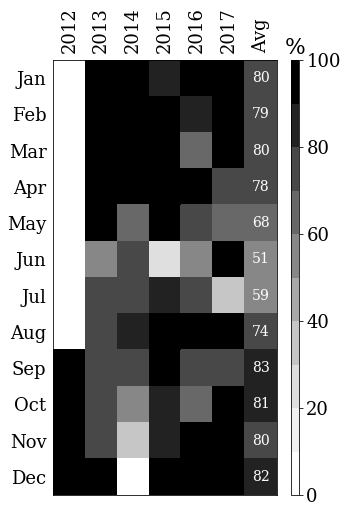

In [21]:
fig = plt.figure(figsize=(5,8))
ax  = fig.add_subplot(111)
cmap = plt.get_cmap('Greys')
norm = BoundaryNorm(np.arange(0.0,100.01,10), ncolors=cmap.N)
p = ax.pcolormesh(completeness,cmap='Greys',norm=norm)
ax.set_xticks([ i+0.5 for i in range(len(years)+1) ])
ax.set_xticklabels([str(y) for y in years]+['Avg'])
ax.xaxis.tick_top()
ax.set_yticks([ i+0.5 for i in range(len(months)) ])
ax.set_yticklabels([month_name[i][0:3] for i in months ])
labels = ax.get_xticklabels()
plt.setp(labels, rotation=90)
ax.xaxis.set_ticks_position('none') 
ax.yaxis.set_ticks_position('none') 
ax.invert_yaxis()
clb = plt.colorbar(p,aspect=50)
clb.ax.set_title('%')

for im,month in enumerate(months):
        ax.text(len(years)+0.5,im+0.5,'{0:.0f}'.format(completeness[im,-1]),
                horizontalalignment='center',verticalalignment='center',
                color='w',fontsize=14)  

fig.savefig(os.path.join(figPath,'M5_completeness_without_wdir_restriction.png'),bbox_inches='tight')

### column names for various QOIs

In [22]:
wdir_cols = [ x for x in df.columns if (("direction" in x.lower())
                        and ('qc' not in x.lower())  
                        and ('std' not in x.lower())) ]
list(wdir_cols)

['Direction (Vane_ 130 m)',
 'Direction (Vane_ 122 m)',
 'Direction (Vane_ 105 m)',
 'Direction (Vane_ 87 m)',
 'Direction (Vane_ 80 m)',
 'Direction (Vane_ 55 m)',
 'Direction (Vane_ 38 m)',
 'Direction (Vane_ 30 m)',
 'Direction (Vane_ 10 m)',
 'Direction (Vane_ 3 m)',
 'Direction (sonic_119m)',
 'Direction (sonic_100m)',
 'Direction (sonic_74m)',
 'Direction (sonic_61m)',
 'Direction (sonic_41m)',
 'Direction (sonic_15m)']

In [23]:
#
# use "equivalent cup speed" from sonic
#
# wspd_cols = [ x for x in df.columns if ( ('speed' in x.lower()) and ('qc' not in x.lower()) and ('cup' in x.lower()) and ('.1' not in x)) ]

#
# use "total speed" from sonic
#
# wspd_cols =  [ x for x in df.columns if ( ('speed' in x.lower()) and ('qc' not in x.lower()) and ('cup_' in x.lower()) and ('.1' not in x)) ] + [ x for x in df.columns if ( ('total speed' in x.lower()) and ('qc' not in x.lower()) and ('.1' not in x)) ]


#
# use "speed" from sonic
#
wspd_cols = [ x for x in df.columns if ( ('speed' in x.lower()) and ('qc' not in x.lower()) and ('cup_' in x.lower()) and ('.1' not in x)) ] + [ x for x in df.columns if ( ('speed (sonic' in x.lower()) 
                            and ('total' not in x.lower()) 
                            and ('equiv' not in x.lower())
                            and ('adv' not in x.lower())
                            and ('qc' not in x.lower()) 
                            and ('.1' not in x)) ]

list(wspd_cols)

['Speed (cup_ 130 m)',
 'Speed (cup_ 122 m)',
 'Speed (cup_ 105 m)',
 'Speed (cup_ 87 m)',
 'Speed (cup_ 80 m)',
 'Speed (cup_ 55 m)',
 'Speed (cup_ 38 m)',
 'Speed (cup_ 30 m)',
 'Speed (cup_ 10 m)',
 'Speed (cup_ 3 m)',
 'Speed (sonic_119m)',
 'Speed (sonic_100m)',
 'Speed (sonic_74m)',
 'Speed (sonic_61m)',
 'Speed (sonic_41m)',
 'Speed (sonic_15m)']

In [24]:
ti_cols = [ x for x in df.columns if (("ti " in x.lower())
                        and ('qc' not in x.lower())  
                        and ('std' not in x.lower())) ]
list(ti_cols)

['Ti (cup_ 130 m)',
 'Ti (cup_ 122 m)',
 'Ti (cup_ 105 m)',
 'Ti (cup_ 87 m)',
 'Ti (cup_ 80 m)',
 'Ti (cup_ 55 m)',
 'Ti (cup_ 38 m)',
 'Ti (cup_ 30 m)',
 'Ti (cup_ 10 m)',
 'Ti (cup_ 3 m)',
 'Cup Equivalent Ti (sonic_119m)',
 'Cup Equivalent Ti (sonic_100m)',
 'Cup Equivalent Ti (sonic_74m)',
 'Cup Equivalent Ti (sonic_61m)',
 'Cup Equivalent Ti (sonic_41m)',
 'Cup Equivalent Ti (sonic_15m)']

In [25]:
L_cols = [ x for x in df.columns if (("obukhov" in x.lower())
                        and ('qc' not in x.lower())  
                        and ('std' not in x.lower())) ]
list(L_cols)

['Monin-Obukhov Length (119m)',
 'Monin-Obukhov Length (100m)',
 'Monin-Obukhov Length (74m)',
 'Monin-Obukhov Length (61m)',
 'Monin-Obukhov Length (41m)',
 'Monin-Obukhov Length (15m)']

# ADD STABILITY FLAG AS A COLUMN

In [26]:
for L_col in L_cols:
    
    z = float(L_col.split('m')[0].split('(')[-1])
    newcolname = "Stability Flag ({0:.0f}m)".format(z)

    for dftouse in [df,df_qc]:
        L = dftouse[L_col].copy()
        categoriesIdx = { 'vu': (L>=-200) & (L<0),
                          'u' : (L>=-500) & (L<-200),
                          'n' : (L<-500) | (L>500),
                          's' : (L>200) & (L<=500),
                          'vs': (L>0) & (L<=200)  }

        dftouse[newcolname] = np.nan
        for cat in categoriesIdx.keys():
            dftouse.loc[categoriesIdx[cat],newcolname] = cat

# SWIFT-LIKE PLOTS OF WDIR VS. TI

In [45]:
dftouse = df_qc

In [46]:
ylabels = {'wdir':'Wind Direction [deg]',
           'wspd':'Wind Speed [m/s]',
           'ti':'Turbulence Intensity [%]'}

* all stabilities

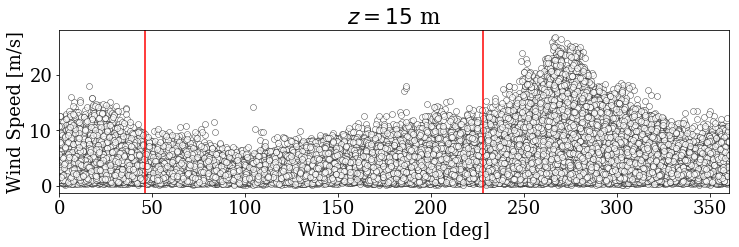

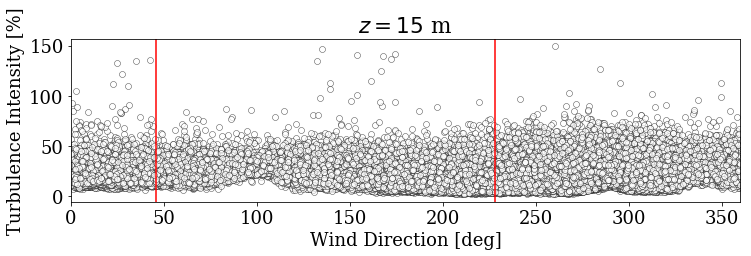

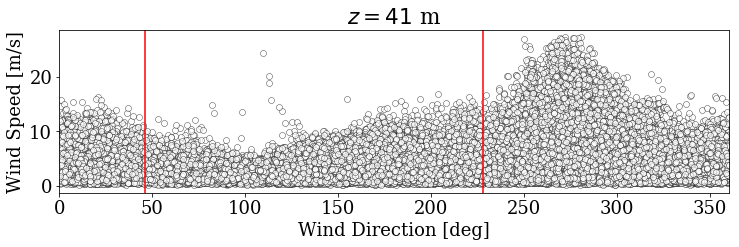

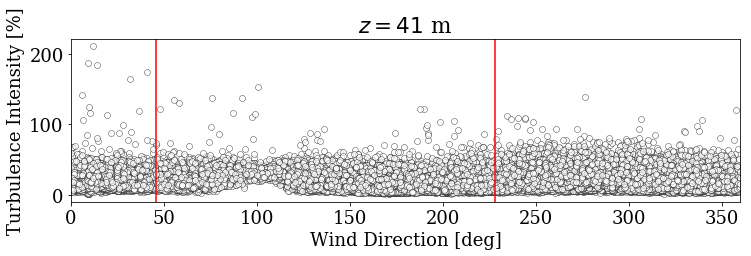

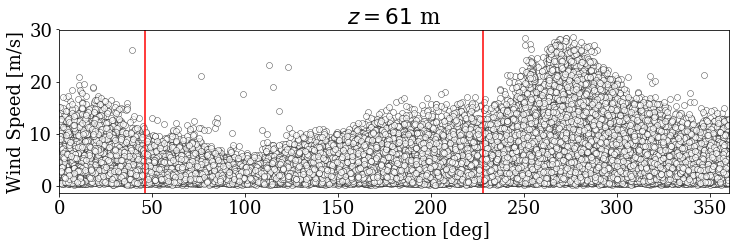

...

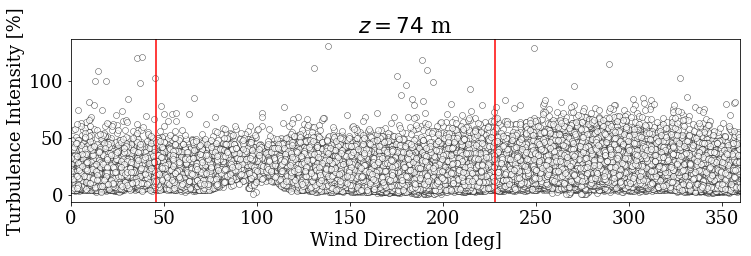

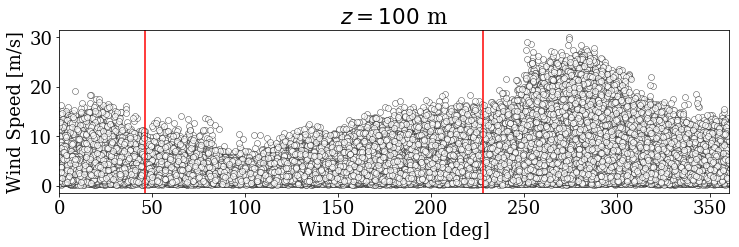

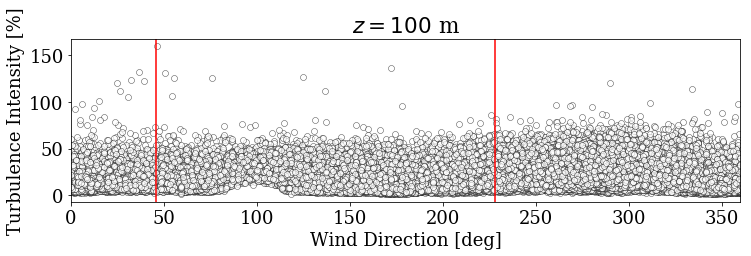

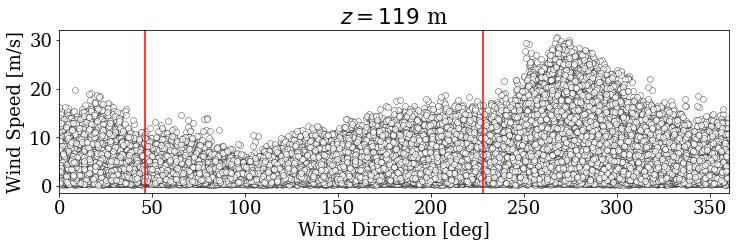

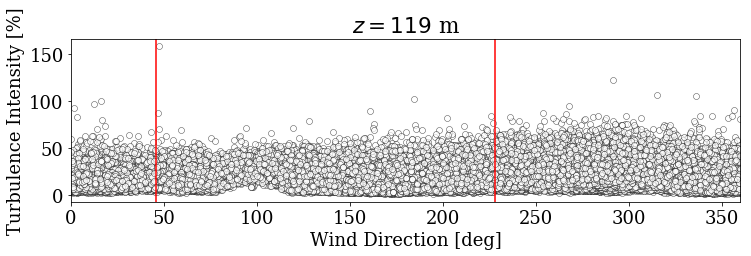

In [48]:
for z in [15,41,61,74,100,119]: 
    cat = pd.concat([dftouse['Direction (sonic_%dm)'%z],
                 dftouse['Cup Equivalent Ti (sonic_%dm)'%z],
                 dftouse['Cup Equivalent Speed (sonic_%dm)'%z],
                 dftouse['\\sigma(u) (sonic_%dm)'%z],
                 dftouse['Turbulent Kinetic Energy (%dm)'%z]], axis=1)
    cat.columns = ['wdir','ti','wspd','usigma','tke']
    
    for col in ['wspd','ti']:

        tmp = cat.copy()
        if col=='ti':
            tmp[tmp.wspd<3]=np.nan
            tmp = tmp.dropna()    
        
        fig = plt.figure(figsize=(12,3))
        ax  = fig.add_subplot(111)
        ax.scatter(tmp['wdir'],tmp[col],marker='o',facecolor='w',color='k',lw=0.5,alpha=0.7)
        ax.set_xlim([0,360])
        #ax.set_ylim([0,120])
        ax.axvline(x=46,color='r')#-r',lw=2)
        ax.axvline(x=228,color='r')#,'-r',lw=2)
        ax.set_title(r'$z={0}$ m'.format(z))
        ax.set_xlabel(ylabels['wdir'])
        ax.set_ylabel(ylabels[col])
        fig.savefig(os.path.join(figPath,'M5_wdir_vs_{0}_{1}m.png'.format(col.upper(), z)),bbox_inches='tight')        

* by stability

In [51]:
colors = {'n':'k',
          'vu':'#922B21',
          'u':'#E74C3C',
          'vs':'#2471A3',
          's':'#7FB3D5'}

labels = {'n':'Neutral',
          'vu':'Very Unstable',
          'u':'Unstable',
          'vs':'Very Stable',
          's':'Stable'}

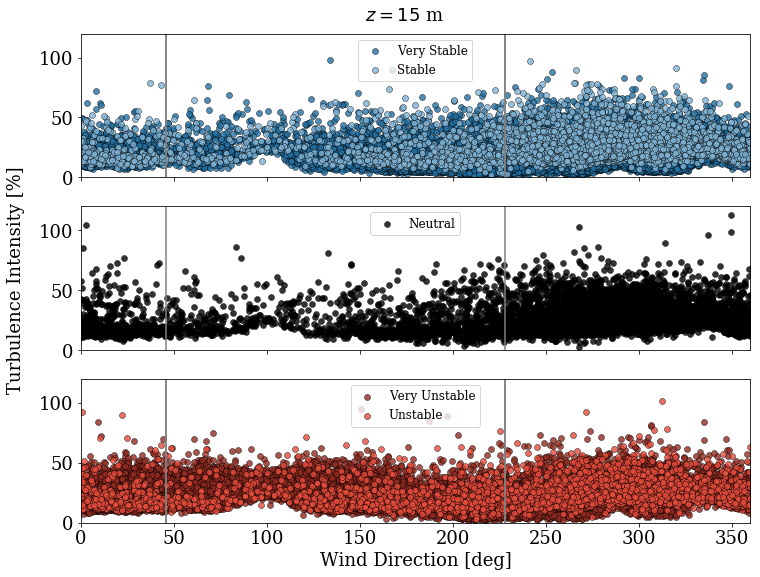

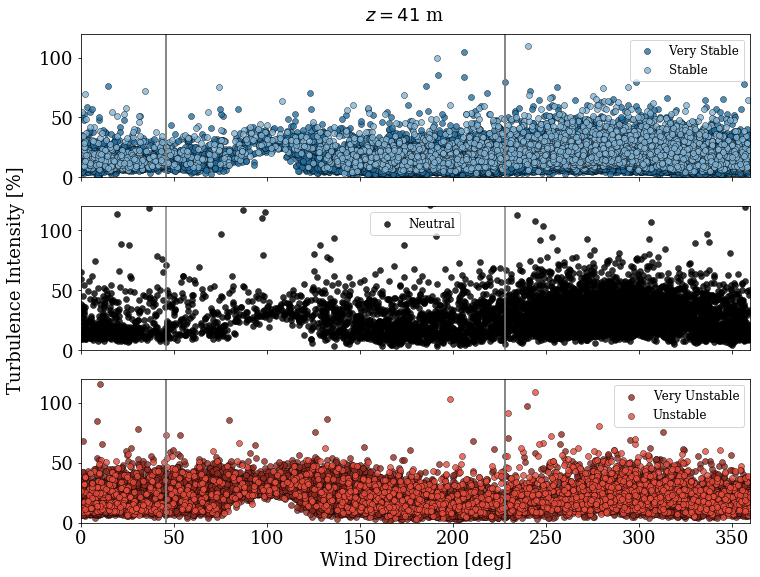

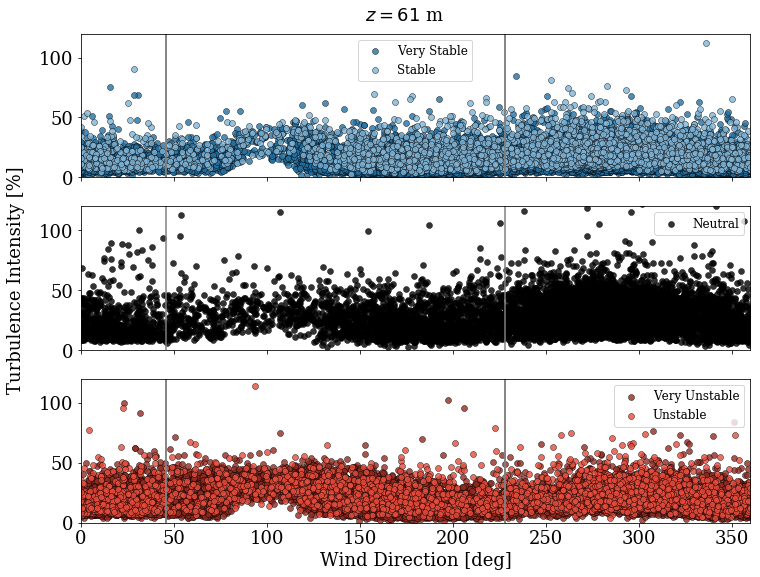

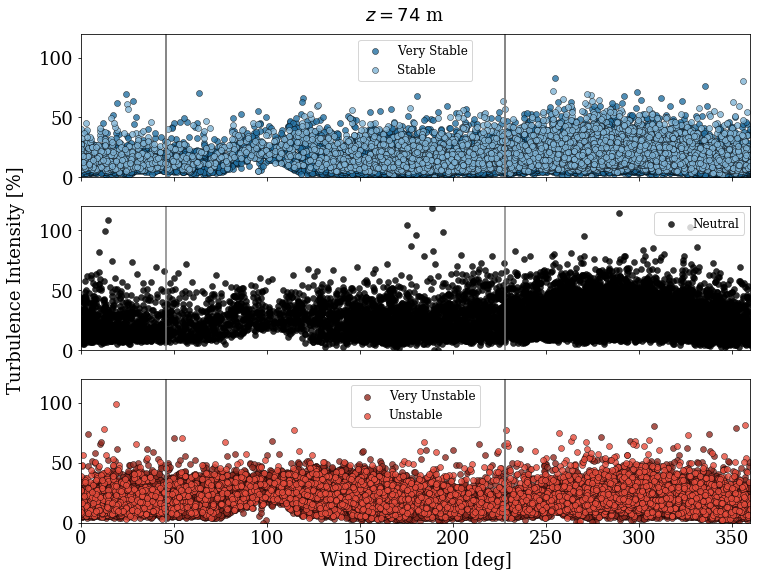

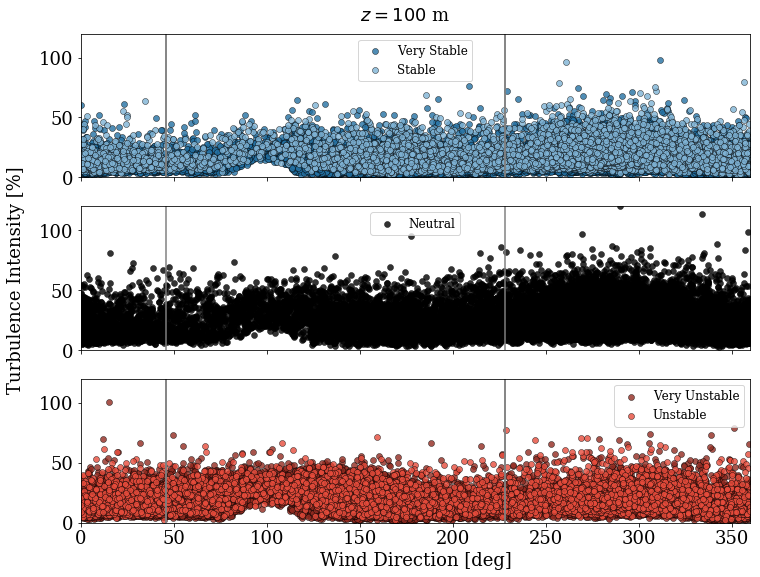

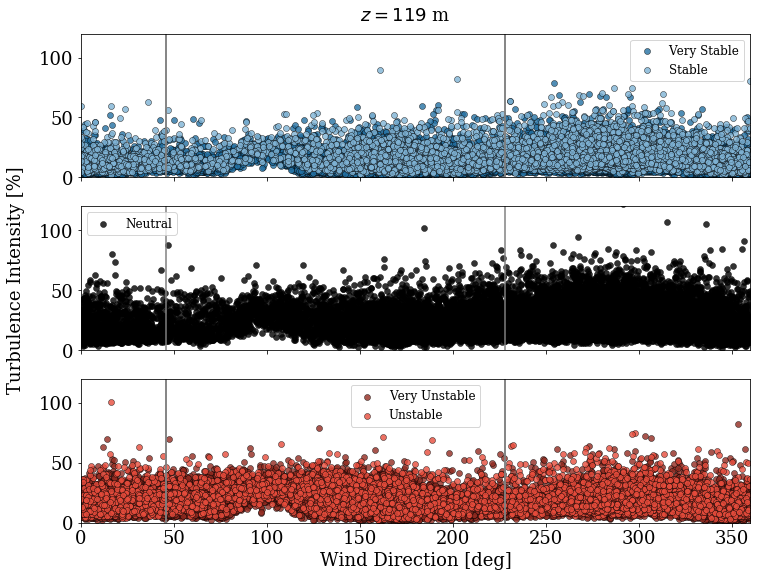

In [53]:
#
# Note: regardless of TI/WDIR height, using 15m for stability estimate.
#

for z in [15,41,61,74,100,119]:

    cat = pd.concat([dftouse['Direction (sonic_%dm)'%z],
                 dftouse['Cup Equivalent Ti (sonic_%dm)'%z],
                 dftouse['Cup Equivalent Speed (sonic_%dm)'%z],
                 dftouse['\\sigma(u) (sonic_%dm)'%z],
                 dftouse['Turbulent Kinetic Energy (%dm)'%z],
                 dftouse['Stability Flag (%dm)'%z]], axis=1)
    cat.columns = ['wdir','ti','wspd','usigma','tke','stability']

    col = 'ti'

    if col=='ti':
        tmp = cat.copy()
        tmp[tmp.wspd<3]=np.nan
        tmp = tmp.dropna()    
    else:
        tmp = cat.copy()
        
    fig = plt.figure(figsize=(12,9))
    ax  = {}
        
    #
    # stable
    #
    axs  = fig.add_subplot(3,1,1)
    for categ in ['vs','s']:
        idx  = tmp['stability']==categ

        axs.scatter(tmp.loc[idx,'wdir'],tmp.loc[idx,col],marker='o',facecolor=colors[categ],color='k',lw=0.5,alpha=0.8,label=labels[categ])
        axs.set_xlim([0,360])
        axs.set_ylim([0,120])
        axs.axvline(x=46,color='gray')#-r',lw=2)
        axs.axvline(x=228,color='gray')#,'-r',lw=2)
        plt.legend(fontsize=12)
        
    #
    # neutral
    #
    axn  = fig.add_subplot(3,1,2)
    for categ in ['n']:
        idx  = tmp['stability']==categ

        axn.scatter(tmp.loc[idx,'wdir'],tmp.loc[idx,col],marker='o',facecolor=colors[categ],color='k',lw=0.5,alpha=0.8,label=labels[categ])
        axn.set_xlim([0,360])
        axn.set_ylim([0,120])
        axn.axvline(x=46,color='gray')#-r',lw=2)
        axn.axvline(x=228,color='gray')#,'-r',lw=2)
        plt.legend(fontsize=12)
        
    #
    # unstable
    #
    axu  = fig.add_subplot(3,1,3)
    for categ in ['vu','u']:
        idx  = tmp['stability']==categ

        axu.scatter(tmp.loc[idx,'wdir'],tmp.loc[idx,col],marker='o',facecolor=colors[categ],color='k',lw=0.5,alpha=0.8,label=labels[categ])
        axu.set_xlim([0,360])
        axu.set_ylim([0,120])
        axu.axvline(x=46,color='gray')#-r',lw=2)
        axu.axvline(x=228,color='gray')#,'-r',lw=2)
        axu.set_xlabel(ylabels['wdir'])
        plt.legend(fontsize=12)
        
    for ax in [axs,axn]:
        plt.setp(ax.get_xticklabels(), visible=False)
        plt.setp(ax.get_xlabel(), visible=False)  
        
    fig.text(0.5, 0.90, r'$z={0}$ m'.format(z), ha='center')        
    fig.text(0.04, 0.5, ylabels[col], va='center', rotation='vertical')
    fig.savefig(os.path.join(figPath,'M5_wdir_vs_TI_by_stability_{0:.0f}m.png'.format(z)),bbox_inches='tight')

# FILTER OUT WIND DIRECTION ACCORDING TO IEC 

In [54]:
# min and max wind directions
excludeAngleStart = 46.0
excludeAngleEnd   = 228.0
# min and max probe heights
zMinToConsider = 41.0
zMaxToConsider = 122.0

In [57]:
wdir_cols

['Direction (Vane_ 130 m)',
 'Direction (Vane_ 122 m)',
 'Direction (Vane_ 105 m)',
 'Direction (Vane_ 87 m)',
 'Direction (Vane_ 80 m)',
 'Direction (Vane_ 55 m)',
 'Direction (Vane_ 38 m)',
 'Direction (Vane_ 30 m)',
 'Direction (Vane_ 10 m)',
 'Direction (Vane_ 3 m)',
 'Direction (sonic_119m)',
 'Direction (sonic_100m)',
 'Direction (sonic_74m)',
 'Direction (sonic_61m)',
 'Direction (sonic_41m)',
 'Direction (sonic_15m)']

In [58]:
# new dataframe filtering out wind directions according to the IEC
# same index as original dataframe
wdir_to_consider_in_excluding_data = pd.DataFrame(index=df.index)
# limit to 
for col in wdir_cols:
    z = float(col.split('m')[0].split('_')[-1]) 
    if ( (z>=zMinToConsider) and (z<=zMaxToConsider) ):
        wdir_to_consider_in_excluding_data[z] = df_qc[col].values

In [59]:
vertical_avg_wdir = pd.Series(index=df.index)
for i in range(len(wdir_to_consider_in_excluding_data)):
    thisrow = wdir_to_consider_in_excluding_data.iloc[i]
    meanwdir = np.degrees(stats.circmean(np.radians(thisrow.dropna())))    
    vertical_avg_wdir.iloc[i] = meanwdir

In [60]:
# identify the indices where the mean wind directions is outside of the allowed range.
idxToRemove = (vertical_avg_wdir>=excludeAngleStart) & (vertical_avg_wdir<=excludeAngleEnd)
print("These criteria will filter out {0:.1f}% of the data.".format(idxToRemove.sum()/float(len(idxToRemove))*100))

In [62]:
df_qc_iec = df.copy()
df_qc_iec.loc[idxToRemove.values] = np.nan
df_qc_iec = df_qc_iec.dropna(how='all')

# AVERAGE BOUNDARY LAYER PROFILE

In [63]:
cup_cols = [ x for x in wspd_cols if ('cup' in x.lower()) ]
sonic_cols = [ x for x in wspd_cols if ('sonic' in x.lower()) ]

both_df         = df_qc_iec[wspd_cols].copy()
both_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in both_df.columns ]

cup_df         = df_qc_iec[cup_cols].copy()
cup_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in cup_df.columns ]

sonic_df         = df_qc_iec[sonic_cols].copy()
sonic_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in sonic_df.columns ]

* all data (after qc/iec filters)

In [68]:
len(sonic_df[100.0])

151672

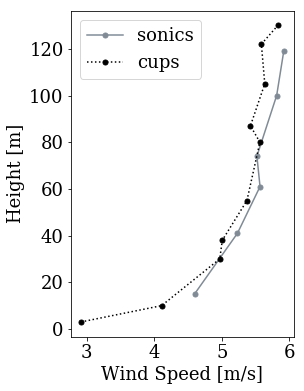

In [64]:
fig = plt.figure(figsize=(4,6))
ax  = fig.add_subplot(111)

tmp = sonic_df.mean().sort_index()
ax.plot(tmp.values,tmp.index,'-o',ms=5,color=light_gray,label='sonics')

tmp = cup_df.mean().sort_index()
ax.plot(tmp.values,tmp.index,':o',ms=5,color='k',mec='k',label='cups')

ax.set_xlabel('Wind Speed [m/s]')
ax.set_ylabel('Height [m]')

plt.legend()

# fig.savefig(os.path.join(figPath,'M5_cup_vs_sonic_wspd_profile.png'),bbox_inches='tight')

In [65]:
cup_cols = [ x for x in ti_cols if ('equivalent' not in x.lower()) ]
sonic_cols = [ x for x in ti_cols if ('equivalent' in x.lower()) ]

both_df         = df_qc_iec[ti_cols].copy()
both_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in both_df.columns ]

cup_df         = df_qc_iec[cup_cols].copy()
cup_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in cup_df.columns ]

sonic_df         = df_qc_iec[sonic_cols].copy()
sonic_df.columns = [ float(x.split('m')[0].split('_')[-1]) for x in sonic_df.columns ]

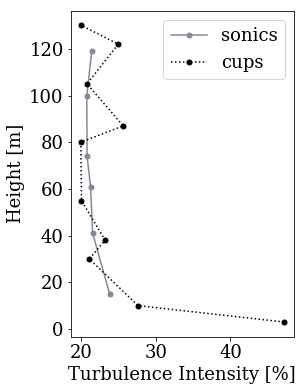

In [69]:
fig = plt.figure(figsize=(4,6))
ax  = fig.add_subplot(111)

tmp = sonic_df.mean().sort_index()
ax.plot(tmp.values,tmp.index,'-o',ms=5,color=light_gray,label='sonics')

tmp = cup_df.mean().sort_index()
ax.plot(tmp.values,tmp.index,':o',ms=5,color='k',mec='k',label='cups')

ax.set_xlabel(ylabels['ti'])
ax.set_ylabel('Height [m]')

plt.legend()

# fig.savefig(os.path.join(figPath,'M5_cup_vs_sonic_wspd_profile.png'),bbox_inches='tight')

# CORRELATE STABILITY AND TI

In [70]:
L_cols

['Monin-Obukhov Length (119m)',
 'Monin-Obukhov Length (100m)',
 'Monin-Obukhov Length (74m)',
 'Monin-Obukhov Length (61m)',
 'Monin-Obukhov Length (41m)',
 'Monin-Obukhov Length (15m)']

(0, 120)

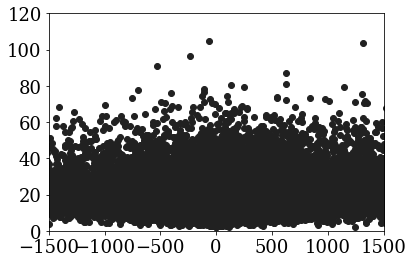

In [71]:
cat = pd.concat( [df_qc_iec['Monin-Obukhov Length (74m)'], 
                  df_qc_iec['Ti (cup_ 80 m)'],
                  df_qc_iec['Speed (cup_ 80 m)']], axis=1 )
cat.columns = ['stability','ti','wspd']
cat[cat.wspd<3] = np.nan
cat = cat.dropna(how='any')

plt.scatter(cat.stability.values,cat.ti.values)
plt.xlim([-1500,1500])
plt.ylim(0,120)

# WIND DIRECTION

Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)


/Users/nhamilto/.local/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The frac parameter was deprecated in version 2.1. Use tick padding via Axes.tick_params instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/Users/nhamilto/.local/lib/python3.6/site-packages/matplotlib/figure.py:2022: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Direction (sonic_74m)
Direction (sonic_100m)
Direction (sonic_119m)
Direction (Vane_ 38 m)
Direction (Vane_ 55 m) only contains nan values.
Direction (Vane_ 80 m) only contains nan values.
Direction (Vane_ 87 m)
Direction (Vane_ 105 m) only contains nan values.
Direction (Vane_ 122 m)
Direction (Vane_ 130 m) only contains nan values.


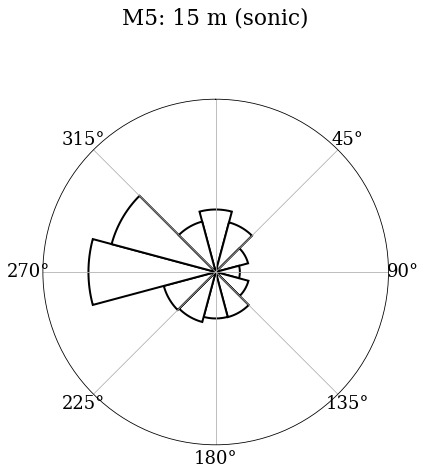

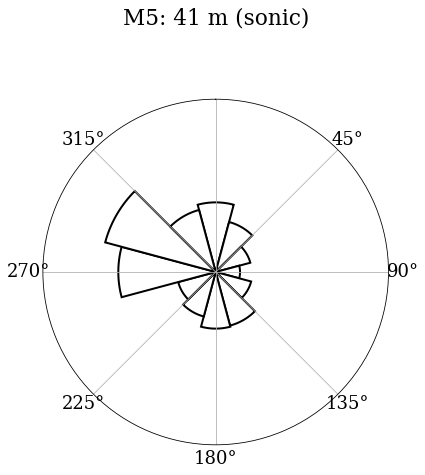

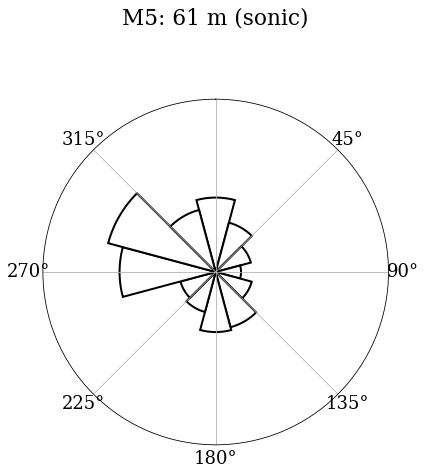

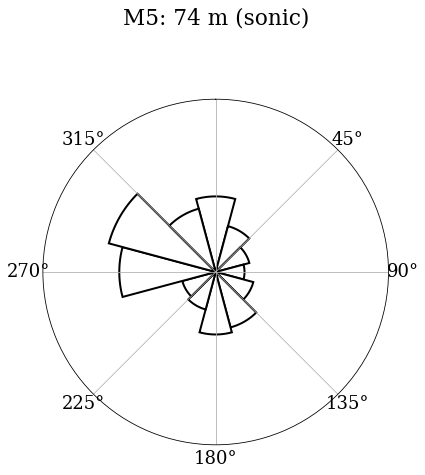

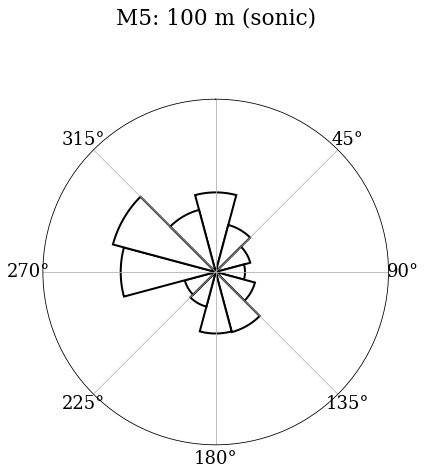

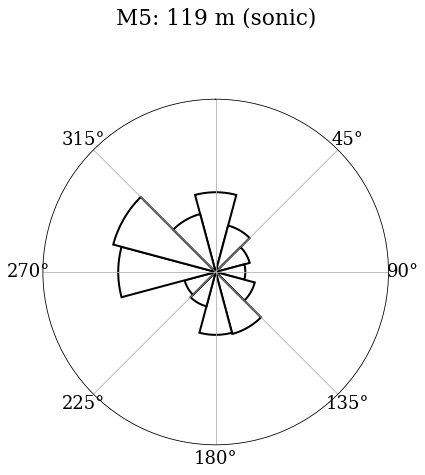

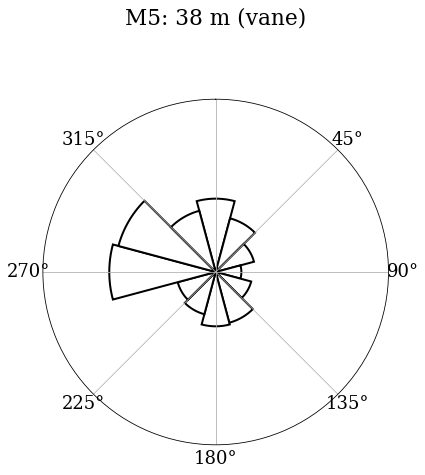

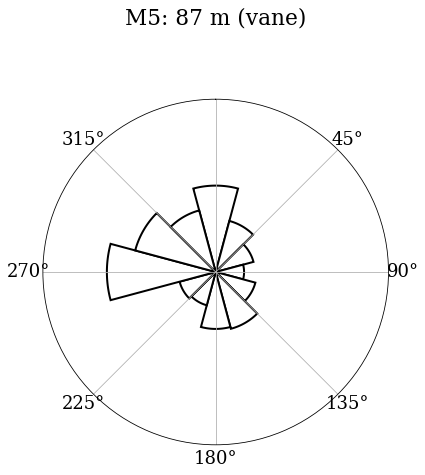

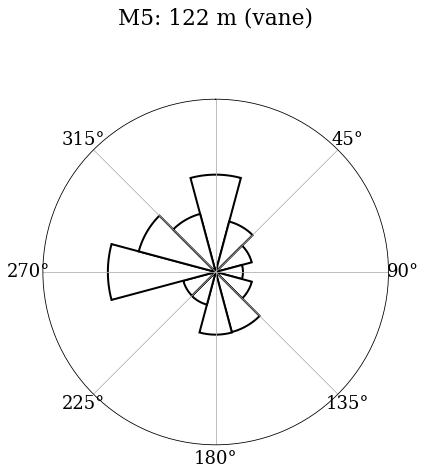

In [82]:
heights = {'sonic':[15, 41, 61, 74, 100, 119],
           'vane':[3, 10, 30, 38, 55, 80, 87, 105, 122, 130]}

for dirType in heights.keys():
    for z in heights[dirType]:

        varName = [ x for x in df.columns if ( (str(z) in x) and (dirType in x.lower()) and ("direction" in x.lower()) and ("qc" not in x.lower()) and (("std" not in x.lower())) )]
        
        if len(varName)==1:
        
            varName = varName[0]
            # several directions sensors produce only nans for some reason
            if len(df[varName].dropna()) == 0:
                print('{0} only contains nan values.'.format(varName))
                continue
            print(varName)
            angles = df[varName].dropna()
            fig = funcs.plot_rose(angles,titleStr="M5: {0} m ({1})".format(z,dirType))          
            fig.tight_layout()
#             fig.savefig(os.path.join(figPath,'M5_wdir_{0}_{1:.0f}m.png'.format(dirType,z)),bbox_inches='tight')

### BY MONTH

Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)
Direction (sonic_74m)


/Users/nhamilto/.local/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: The frac parameter was deprecated in version 2.1. Use tick padding via Axes.tick_params instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


Direction (sonic_100m)
Direction (sonic_119m)
Direction (Vane_ 38 m)
Direction (Vane_ 55 m)
Direction (Vane_ 80 m)
Direction (Vane_ 87 m)
Direction (Vane_ 105 m)


/Users/nhamilto/.local/lib/python3.6/site-packages/numpy/lib/function_base.py:838: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


Direction (Vane_ 122 m)
Direction (Vane_ 130 m)
Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)
Direction (sonic_74m)
Direction (sonic_100m)
Direction (sonic_119m)


/Users/nhamilto/.local/lib/python3.6/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Direction (Vane_ 38 m)
Direction (Vane_ 55 m)
Direction (Vane_ 80 m)
Direction (Vane_ 87 m)
Direction (Vane_ 105 m)
Direction (Vane_ 122 m)
Direction (Vane_ 130 m)
Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)
Direction (sonic_74m)
Direction (sonic_100m)
Direction (sonic_119m)
Direction (Vane_ 38 m)
Direction (Vane_ 55 m)
Direction (Vane_ 80 m)
Direction (Vane_ 87 m)
Direction (Vane_ 105 m)
Direction (Vane_ 122 m)
Direction (Vane_ 130 m)
Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)
Direction (sonic_74m)
Direction (sonic_100m)
Direction (sonic_119m)
Direction (Vane_ 38 m)
Direction (Vane_ 55 m)
Direction (Vane_ 80 m)
Direction (Vane_ 87 m)
Direction (Vane_ 105 m)
Direction (Vane_ 122 m)
Direction (Vane_ 130 m)
Direction (sonic_15m)
Direction (sonic_41m)
Direction (sonic_61m)
Direction (sonic_74m)
Direction (sonic_100m)
Direction (sonic_119m)
Direction (Vane_ 38 m)
Direction (Vane_ 55 m)
Direction (Vane_ 80 m)
Direction (Vane_ 87 m)
Direction (Van

/Users/nhamilto/.local/lib/python3.6/site-packages/matplotlib/projections/polar.py:58: RuntimeWarning: invalid value encountered in less
  mask = r < 0


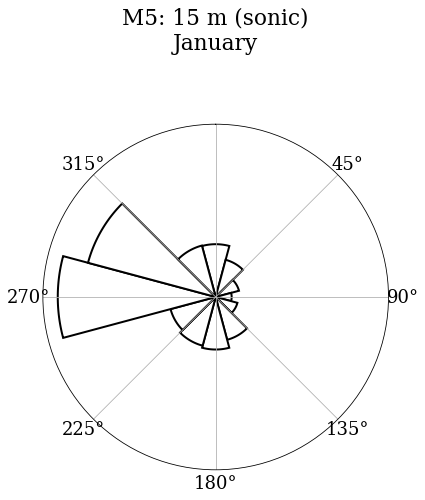

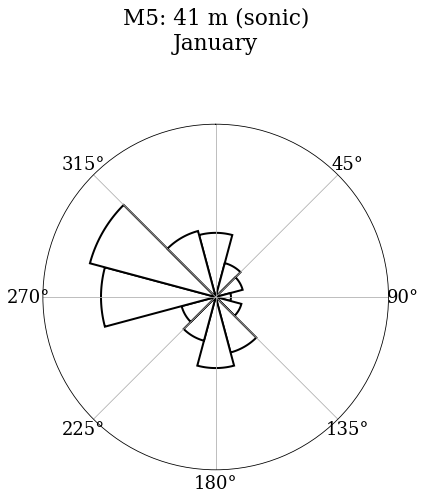

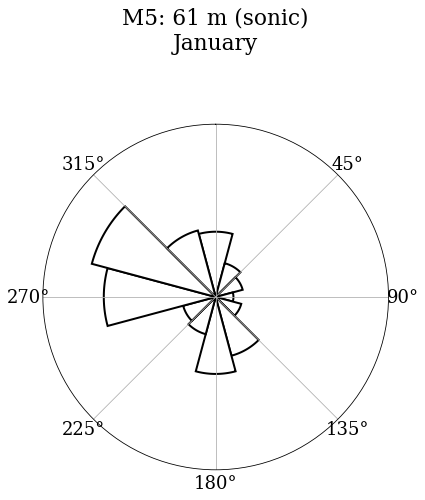

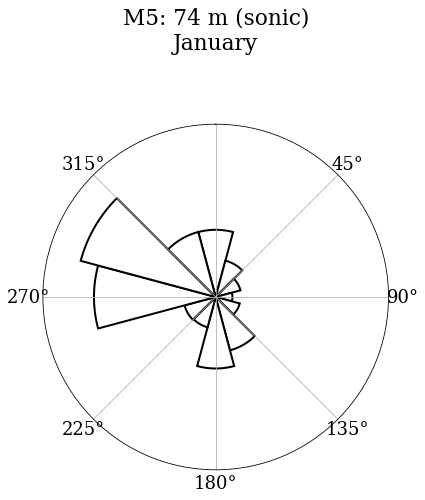

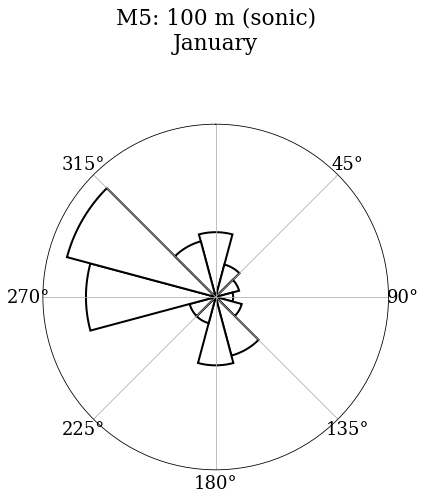

...

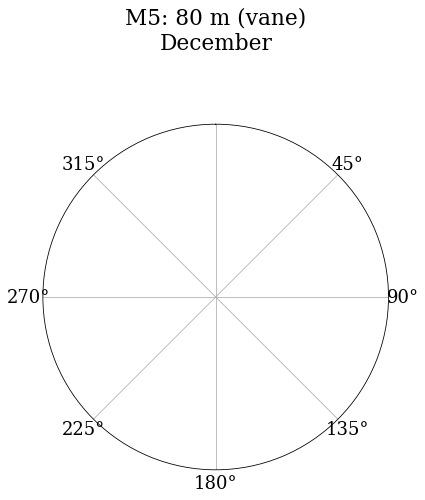

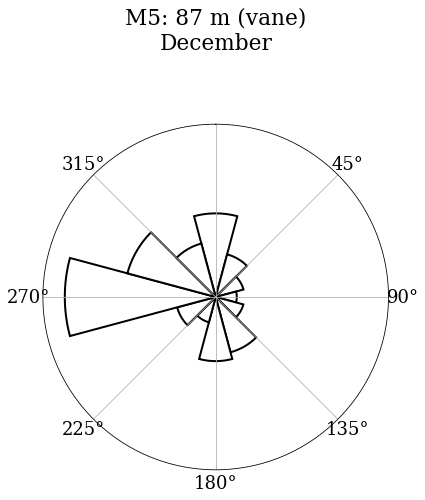

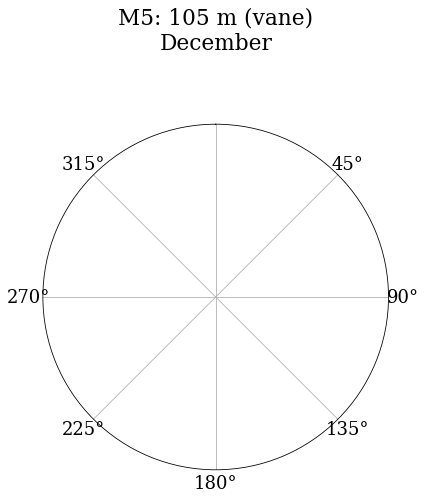

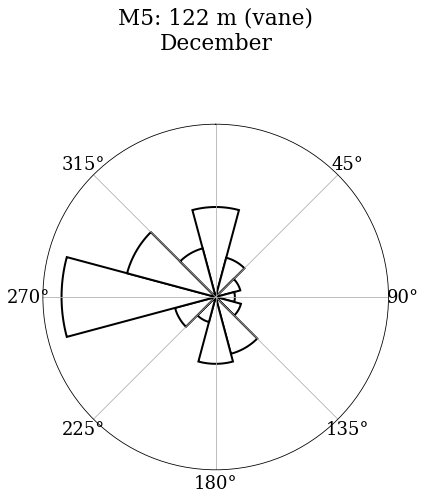

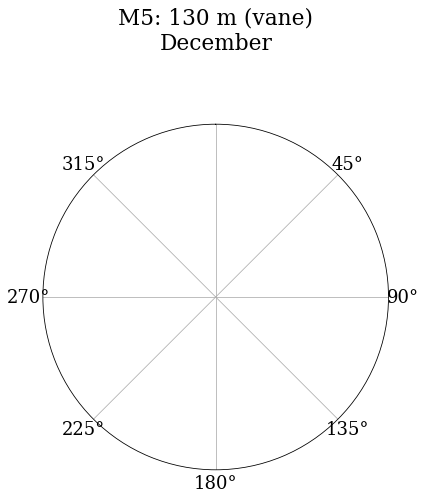

In [76]:
for month in months:
    monthname = month_name[month]
    idx = (df.index.month==month)
    
    for dirType in heights.keys():
        for z in heights[dirType]:
            varName = [ x for x in df.columns if ( (str(z) in x) and (dirType in x.lower()) and ("direction" in x.lower()) and ("qc" not in x.lower()) and (("std" not in x.lower())) )]
            if len(varName)==1:
                varName = varName[0]
                print(varName)
                angles = df[varName][idx].dropna()
            fig = funcs.plot_rose(angles,titleStr="M5: {0:.0f} m ({1})\n{2}".format(z,dirType,monthname))            
#             fig.savefig(os.path.join(figPath,'M5_wdir_{2}_{0}_{1:.0f}m.png'.format(dirType,z,monthname[0:3])),bbox_inches='tight')

### ALL INSTRUMENTS TOGETHER

In [ ]:
heights = {'sonic': [15, 41, 61, 74, 100, 119],
           'vane': [3, 10, 30, 38, 55, 80, 87, 105, 122, 130]}

fig = plt.figure(figsize=(6,6))
ax  = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)
ax.set_xticks(np.radians(np.arange(0,360,10)))
ax.set_yticks([0,100])    

ax.set_theta_offset((np.pi)/2)
ax.set_theta_direction(-1)   
ax.xaxis.get_majorticklabels()[0].set_visible(False)         

for l in ax.yaxis.get_majorticklabels():
    l.set_visible(False)

# make some x ticks invisible
xticks = ax.xaxis.get_majorticklabels()
nticks = len(xticks)
thetaticks = np.linspace(0,  360, 8, endpoint=False)
ax.set_thetagrids(thetaticks, frac=1.2)    

for dirType in heights.keys():
    for z in heights[dirType]:
        varName = [ x for x in df.columns if ( (str(z) in x) and (dirType in x.lower()) and ("direction" in x.lower()) and ("qc" not in x.lower()) and (("std" not in x.lower())) )]        
        if len(varName)==1:
            varName = varName[0] ; print varName
            angles = df[varName].dropna()
            angles[angles>=345] = angles[angles>=345] - 360.0
            frqs, bins = np.histogram(angles.values,bins=np.arange(-15.0,345.1,30.0),density=True)
            bins_centers = [ np.mean([bins[i],bins[i+1]]) for i in range(len(bins)-1) ]
            bins = [ np.radians(b) for b in bins_centers ]
            frqs = np.asarray([ float(f)/(sum(frqs)) for f in frqs ])
            ax.bar(bins, frqs, alpha=1, width=np.radians(30.0), color='k', lw=2, fc='None', ec='k')
ax.set_ylim([0,0.25])            
ax.set_title("M5: all instruments, all data")
fig.savefig(os.path.join(figPath,'M5_wdir_allInstrumentsOverlaid.png'),bbox_inches='tight')

In [ ]:
heights = {'sonic':[15, 41, 61, 74, 100, 119],
           'vane':[3, 10, 30, 38, 55, 80, 87, 105, 122, 130]}

for month in months:
    monthname = month_name[month]
    idx = (df.index.month==month)

    fig = plt.figure(figsize=(6,6))
    ax  = fig.add_axes([0.1, 0.1, 0.8, 0.8], polar=True)
    ax.set_xticks(np.radians(np.arange(0,360,10)))
    ax.set_yticks([0,100])    

    ax.set_theta_offset((np.pi)/2)
    ax.set_theta_direction(-1)   
    ax.xaxis.get_majorticklabels()[0].set_visible(False)         

    for l in ax.yaxis.get_majorticklabels():
        l.set_visible(False)

    # make some x ticks invisible
    xticks = ax.xaxis.get_majorticklabels()
    nticks = len(xticks)
    thetaticks = np.linspace(0,  360, 8, endpoint=False)
    ax.set_thetagrids(thetaticks, frac=1.2)    

    for dirType in heights.keys():
        for z in heights[dirType]:
            varName = [ x for x in df.columns if ( (str(z) in x) and (dirType in x.lower()) and ("direction" in x.lower()) and ("qc" not in x.lower()) and (("std" not in x.lower())) )]        
            if len(varName)==1:
                varName = varName[0] ; print varName
                angles = df[varName][idx].dropna()
                angles[angles>=345] = angles[angles>=345] - 360.0
                frqs, bins = np.histogram(angles.values,bins=np.arange(-15.0,345.1,30.0),density=True)
                bins_centers = [ np.mean([bins[i],bins[i+1]]) for i in range(len(bins)-1) ]
                bins = [ np.radians(b) for b in bins_centers ]
                frqs = np.asarray([ float(f)/(sum(frqs)) for f in frqs ])
                ax.bar(bins, frqs, alpha=1, width=np.radians(30.0), color='k', lw=2, fc='None', ec='k')
    ax.set_ylim([0,0.25])
    ax.set_title("M5: all instruments\n{0}".format(monthname))
    fig.savefig(os.path.join(figPath,'M5_wdir_allInstrumentsOverlaid_{0}.png'.format(monthname[0:3])),bbox_inches='tight')

# WIND SPEED

* Diurnal cycle (OK)
    * Considering all (wdir-filtered) data, plotted by height (OK)
    * Considering all (wdir-filtered) data, plotted by month and by height (OK)

In [ ]:
cmap = mpl.cm.get_cmap('viridis')

### DIURNAL CYCLE -- BY HEIGHT

In [ ]:
diurnal_cycle = wspd_df.groupby(wspd_df.index.hour).mean()

In [ ]:
fig = plt.figure(figsize=(6,6))
ax  = fig.add_subplot(111)
for iz,z in enumerate(np.sort(diurnal_cycle.columns)[::-1]):
    ax.plot(diurnal_cycle[z], lw=(iz+1)*0.5, color=cmap(iz/float(len(diurnal_cycle.columns))),
            label="{0:.0f} m".format(z))
ax.set_yticks([3,4,5])    
ax.set_xlabel('Time of Day [LT]')    
ax.set_ylabel('Wind Speed [m/s]')
plt.legend(bbox_to_anchor=(1.05,1.0),fontsize=13,frameon=False)
ax.set_title('M5')
fig.savefig(os.path.join(figPath,'M5_wspd_diurnalCycle_byHeight.png'),bbox_inches="tight")

### DIURNAL CYCLE -- BY HEIGHT, BY MONTH

In [ ]:
fig = plt.figure(figsize=(12,15))

axbig = fig.add_subplot(111)
axbig.spines['top'].set_color('none')
axbig.spines['bottom'].set_color('none')
axbig.spines['left'].set_color('none')
axbig.spines['right'].set_color('none')
axbig.tick_params(labelcolor='w', top='off', bottom='off', left='off', right='off')
axbig.set_xlabel('Time of Day [LT]',labelpad=15)    
axbig.set_ylabel('Wind Speed [m/s]')
axbig.set_title('M5',y=1.05)

ax  = {}

for im,month in enumerate(months):

    monthname = month_name[month]
    idx = (df.index.month==month)
    subset = df[cols][idx]

    diurnal_cycle = subset.groupby(subset.index.hour).mean()    
    diurnal_cycle.columns = [ float(x.split('m')[0].split('_')[-1]) for x in diurnal_cycle.columns ]


    ax[im]  = fig.add_subplot(4,3,im+1)
    
    for iz,z in enumerate(np.sort(diurnal_cycle.columns)[::-1]):
        ax[im].plot(diurnal_cycle[z], lw=(iz*0.5+1)*0.5, 
                color=cmap(iz/float(len(diurnal_cycle.columns))),#'k',
                label="{0:.0f} m".format(z))

    ax[im].set_yticks([2,4,6,8,10])    
    ax[im].set_ylim([1.25,10])
    ax[im].set_xticks(np.arange(0,24,6))
    ax[im].set_title('{0}'.format(monthname[0:3]))
    ax[im].tick_params(axis='both', direction='in')
    
    if im not in [9,10,11]:
        plt.setp(ax[im].get_xticklabels(), visible=False)
        plt.setp(ax[im].get_xlabel(), visible=False)       
    
    if im not in [0,3,6,9]:
        plt.setp(ax[im].get_yticklabels(), visible=False)
        plt.setp(ax[im].get_ylabel(), visible=False)           
    
ax[2].legend(bbox_to_anchor=(1.05,1.0),fontsize=13,frameon=False)
fig.savefig(os.path.join(figPath,'M5_wspd_diurnalCycle_byHeight_{0}.png'.format(monthname[0:3])),bbox_inches="tight")    

* Vertical profile
    * Considering all (wdir-filtered) data, plotted by stabilty
    * Considering all (wdir-filtered) data, plotted by month
    * Considering all (wdir-filtered) data, plotted by time of day and by month    
* By month
* By TI
* By stability class
* By wind direction

### VERTICAL PROFILE -- BY STABILITY

In [ ]:
for cat in categoriesIdx.keys():
    idx = categoriesIdx[cat].values
    stability.loc[idx,'category']  = cat

wspd_df['stability'] = stability['category']

In [ ]:
wspd_by_stability = wspd_df.groupby('stability').mean().T.sort_index()

In [ ]:
fig = plt.figure(figsize=(5,8))
ax  = fig.add_subplot(111)
for key in wspd_by_stability.columns:
    ax.plot(wspd_by_stability[key].values,wspd_by_stability[key].index,label=key)
plt.legend()

In [ ]:
stability

In [ ]:
wspd_df.loc['2012-08-30 20:30:00-06:00']

### HEIGHT

### TI 

### STABILITY

### WIND DIRECTION

In [ ]:
list(diurnal_cycle.columns)

In [ ]:
varName = 'd(u)/d(t) (sonic_61m)'

fig = plt.figure(figsize=(6,5))
ax  = fig.add_subplot(111)
ax.plot(diurnal_cycle[varName],'-.k')
ax.set_xlabel('Hour of Day')
ax.set_ylabel(varName)

In [ ]:
print(metPathLoHz)